In [353]:
%load_ext autoreload
# from ggplot import *
%autoreload 2
import itertools
from util import *
from sklearn.manifold import TSNE
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [354]:
data_df.head()

,item_id,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v,stock_id
0,4882128,1,-0.0,2.0,NaN,2.0,2.0,0,1,8,6,6,0.0,-0.000000,0.125000,NaN,0.000000,61457912326720125
1,6046687,4,42.0,50.0,1.076923,27.0,0.0,6,3,65,58,4,50.0,0.840000,0.092308,0.266469,17.437820,28507246001
2,6759961,0,0.0,999.0,NaN,999.0,999.0,0,0,5,4,3,0.0,0.000000,0.000000,NaN,0.000000,759120191261
3,6968201,3,-0.0,300.0,NaN,300.0,300.0,2,3,16,10,7,0.0,-0.000000,0.312500,NaN,0.000000,24431974001
4,6082258,7,2.0,14.0,1.000000,12.0,10.0,3,5,63,50,4,4.0,0.142857,0.190476,0.000000,0.870288,-2068242421835884824


In [459]:
data_df = pd.read_pickle("data/feature_engineered_df")
data_df_cleaned = data_df[data_df.mean_in_cluster.notnull()]

In [460]:
data_df_cleaned = data_df_cleaned.dropna()

In [461]:
stock_id = data_df_cleaned.stock_id
item_id = data_df_cleaned.item_id

In [462]:


data_df_cleaned = data_df_cleaned.loc[:, (data_df_cleaned.columns != 'item_id') & (data_df_cleaned.columns != 'stock_id')]

In [463]:
data_df_cleaned

,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v
1,4,42.0,50.0,1.076923,27.0,0.0,6,3,65,58,4,50.0,0.840000,0.092308,0.266469,17.437820
4,7,2.0,14.0,1.000000,12.0,10.0,3,5,63,50,4,4.0,0.142857,0.190476,0.000000,0.870288
7,4,11.0,493.0,2.125000,484.0,446.0,6,11,47,29,1,47.0,0.022312,0.361702,1.899836,15.465948
9,3,-0.0,50.0,51.000000,50.0,50.0,0,3,10,4,1,0.0,-0.000000,0.500000,0.000000,0.000000
11,47,1.0,8.0,1.555556,6.5,1.0,1,4,105,45,1,7.0,0.125000,0.561905,0.831479,2.941217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23698,1,5.0,10.0,6.000000,6.0,1.0,1,5,28,22,3,9.0,0.500000,0.178571,2.000000,2.230566
23700,19,2.0,5.0,3.500000,4.0,2.0,1,4,90,67,7,3.0,0.400000,0.244444,1.658312,0.915552
23703,16,-0.0,1.0,2.000000,1.0,1.0,1,14,81,14,1,0.0,-0.000000,0.814815,0.000000,0.000000
23705,6,4.0,8.0,6.769231,6.0,3.0,1,14,61,14,1,5.0,0.500000,0.754098,1.526879,1.526070


In [374]:
data_df_cleaned.head()

,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v
1,4,42.0,50.0,1.076923,27.0,0.0,6,3,65,58,4,50.0,0.840000,0.092308,0.266469,17.437820
4,7,2.0,14.0,1.000000,12.0,10.0,3,5,63,50,4,4.0,0.142857,0.190476,0.000000,0.870288
7,4,11.0,493.0,2.125000,484.0,446.0,6,11,47,29,1,47.0,0.022312,0.361702,1.899836,15.465948
9,3,-0.0,50.0,51.000000,50.0,50.0,0,3,10,4,1,0.0,-0.000000,0.500000,0.000000,0.000000
11,47,1.0,8.0,1.555556,6.5,1.0,1,4,105,45,1,7.0,0.125000,0.561905,0.831479,2.941217


In [376]:
data_df_cleaned_sel = data_df_cleaned[['mean_in_cluster', 'n_cluster', 'n_jumps', 'std_in_cluster', 'ratio_drop']]

In [380]:
data_df_cleaned_sel.head()

,mean_in_cluster,n_cluster,n_jumps,std_in_cluster,ratio_drop
1,1.076923,6,58,0.266469,0.840000
4,1.000000,3,50,0.000000,0.142857
7,2.125000,6,29,1.899836,0.022312
9,51.000000,0,4,0.000000,-0.000000
11,1.555556,1,45,0.831479,0.125000


In [377]:
data_df_cleaned_sel_scaled = preprocessing.scale(data_df_cleaned_sel)

In [378]:
X_tsne_sel_scaled = TSNE(learning_rate=20).fit_transform(data_df_cleaned_sel_scaled)

array([[-39.40263367, -18.40044975],
       [-16.3415947 , -25.62820625],
       [-43.64541245, -14.77582932],
       ..., 
       [  5.38628292, -34.71820831],
       [ 19.47066498,  -5.78099966],
       [  0.64333576,  -1.25502884]], dtype=float32)

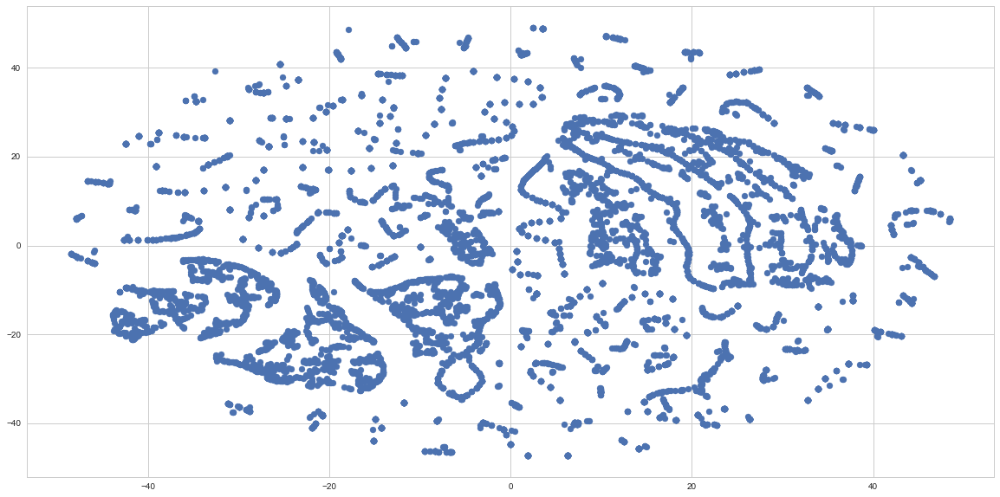

In [382]:
plt.figure(figsize=(20, 10))
plt.scatter(X_tsne_sel_scaled[:, 0], X_tsne_sel_scaled[:, 1])

In [ ]:
X_tsne_sel_scaled[:, 0]

In [385]:
data_df_cleaned['item_id'] = item_id

In [386]:
data_df_cleaned['X'] = X_tsne_sel_scaled[:, 0]
data_df_cleaned['Y'] = X_tsne_sel_scaled[:, 1]

In [387]:
data_df_cleaned.head()

,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v,item_id,X,Y
1,4,42.0,50.0,1.076923,27.0,0.0,6,3,65,58,4,50.0,0.840000,0.092308,0.266469,17.437820,6046687,-39.402634,-18.400450
4,7,2.0,14.0,1.000000,12.0,10.0,3,5,63,50,4,4.0,0.142857,0.190476,0.000000,0.870288,6082258,-16.341595,-25.628206
7,4,11.0,493.0,2.125000,484.0,446.0,6,11,47,29,1,47.0,0.022312,0.361702,1.899836,15.465948,6436054,-43.645412,-14.775829
9,3,-0.0,50.0,51.000000,50.0,50.0,0,3,10,4,1,0.0,-0.000000,0.500000,0.000000,0.000000,7101373,-34.379768,3.730428
11,47,1.0,8.0,1.555556,6.5,1.0,1,4,105,45,1,7.0,0.125000,0.561905,0.831479,2.941217,4953411,27.832067,21.150990


In [391]:
data_df_cleaned.item_id[(data_df_cleaned.X < -35) & (data_df_cleaned.Y < 0)].values

array([6046687, 6436054, 5584011, 5133531, 5687408, 5446612, 6688728,
       5336343, 5901249, 4977684, 5877568, 5510716, 4913721, 5584752,
       5697317, 5362006, 4853830, 5133534, 5933999, 5739346, 5838309,
       5222669, 5560702, 4854047, 6494737, 5659527, 4820234, 5569314,
       5001155, 5618709, 5057699, 5584641, 6300952, 6110738, 5323128,
       5902377, 4909985, 6677068, 6457931, 5770828, 5580758, 5072921,
       6637459, 5030996, 6318495, 5366382, 6220809, 5987238, 4974061,
       4832853, 4942926, 5258600, 5203431, 5396418, 6485721, 5661464,
       4916662, 6201735, 5605534, 5404815, 5532306, 5942296, 5408192,
       5888684, 6088025, 5187939, 5387005, 5403350, 5720557, 5220889,
       5323057, 6153609, 5141009, 5819395, 6208784, 5188595, 5784768,
       6664690, 6736028, 5318580, 6241823, 6262169, 5366382, 6049415,
       5403773, 5407522, 6602082, 5786523, 5018603, 5855184, 5649537,
       6078578, 6074572, 6430780, 5584724, 6298077, 5649058, 6497018,
       4880298, 6601

In [ ]:
X_tsne_sel_scaled

In [453]:
eps=3
min_samples=5

# date = df.index
# df['INDEX'] = np.arange(3, len(df.STOCK_AMOUNT) + 3)
# Z = df[['STOCK_AMOUNT', 'INDEX']].values
# Z = np.vstack((Z, [[0, 2], [500, 1]]))

# scaler = preprocessing.MinMaxScaler(feature_range=(0, 100))
# Z[:, 0] = scaler.fit_transform(Z[:, 0].reshape(-1, 1))[:, 0]
# X = StandardScaler().fit_transform(Z)
db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_tsne_sel_scaled)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)

In [454]:
n_clusters_

83

In [455]:
labels

array([ 0,  1,  0, ..., 79,  3,  7])

In [456]:
tsne_df = pd.DataFrame(X_tsne_sel_scaled, columns=['X', 'Y'])

In [457]:
tsne_df['label'] = labels

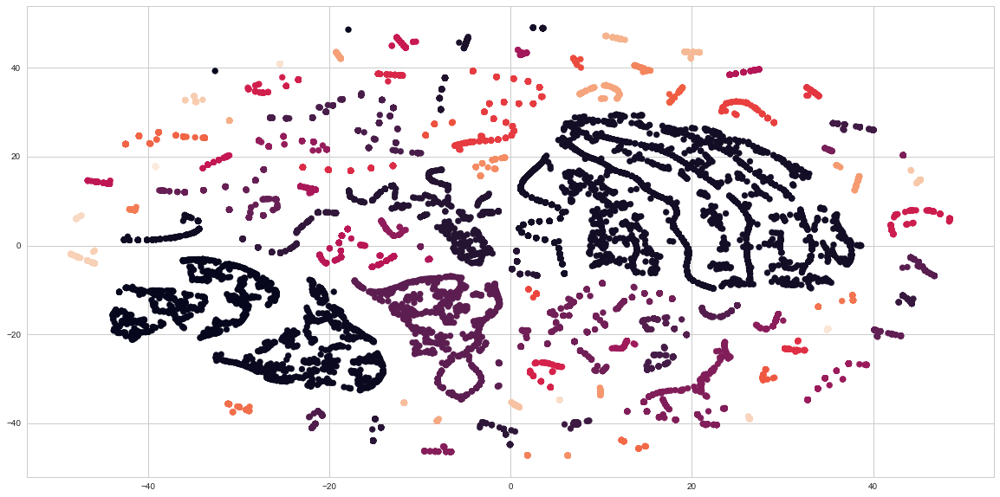

In [458]:
plt.figure(figsize=(20, 10))
plt.scatter(tsne_df.X, tsne_df.Y, c = tsne_df.label)

In [338]:
X_pca = PCA().fit_transform(data_df_cleaned_scaled)

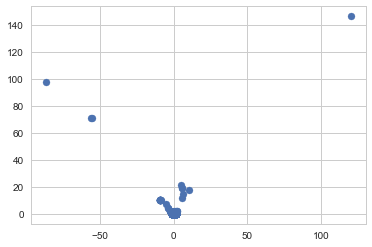

In [339]:
plt.scatter(X_pca[:, 1], X_pca[:, 0])

In [53]:
data_df_cleaned_scaled.shape

(12144, 17)

In [86]:
def pca_results(data, pca):
    
    # Dimension indexing
    dimensions = ['Dimension {}'.format(i) for i in range(1,len(pca.components_)+1)]
    
    # PCA components
    components = pd.DataFrame(np.round(pca.components_, 4), columns = data.keys()) 
    components.index = dimensions

    # PCA explained variance
    ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1) 
    variance_ratios = pd.DataFrame(np.round(ratios, 4), columns = ['Explained Variance']) 
    variance_ratios.index = dimensions

    # Create a bar plot visualization
    fig, ax = plt.subplots(figsize = (14,8))

    # Plot the feature weights as a function of the components
    components.plot(ax = ax, kind = 'bar')
    ax.set_ylabel("Feature Weights") 
    ax.set_xticklabels(dimensions, rotation=0)

    # Display the explained variance ratios# 
    for i, ev in enumerate(pca.explained_variance_ratio_): 
        ax.text(i-0.40, ax.get_ylim()[1] + 0.05, "Explained Variance\n %.4f"%(ev))

    # Return a concatenated DataFrame
    return pd.concat([variance_ratios, components], axis = 1)

In [87]:
pca = PCA(n_components=16).fit(data_df_cleaned_scaled)
pca_samples = pca.transform(data_df_cleaned_scaled)

In [93]:
pca_results = pca_results(data_df_cleaned, pca)

TypeError: 'DataFrame' object is not callable

In [89]:
pca_results.cumsum()

,Explained Variance,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v
Dimension 1,0.2305,0.0017,0.3692,0.4952,0.2704,0.3660,0.3549,-0.0046,-0.0139,-0.0215,-0.0199,0.0041,0.3754,0.0034,-0.0014,0.0523,0.3750
Dimension 2,0.4046,0.1640,0.7610,0.3525,-0.0310,-0.0140,-0.0361,0.1192,0.1139,0.1862,0.1180,0.0240,0.7671,0.0799,0.0707,0.0672,0.7658
Dimension 3,0.5612,-0.1893,0.9006,0.2796,-0.1422,-0.1748,-0.2012,-0.2245,-0.2343,-0.3705,-0.2873,0.0298,0.9071,-0.0352,-0.0642,0.0890,0.9062
Dimension 4,0.6668,-0.3441,0.9140,0.2824,-0.1625,-0.1795,-0.2049,-0.0748,-0.6439,-0.2891,0.2263,0.0785,0.9191,-0.0568,-0.7794,0.0768,0.9182
Dimension 5,0.7334,-0.6529,0.9255,0.2793,-0.1685,-0.1927,-0.2227,-0.1746,-0.3293,-0.1405,0.3631,-0.3451,0.9436,-0.8060,-0.8051,0.1844,0.9444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Dimension 12,0.9985,0.4390,0.8571,0.0179,0.8251,-0.4671,-0.5343,0.2480,-0.6626,0.2798,-0.6889,0.2833,0.9599,-1.7210,-1.4455,1.3499,0.9791
Dimension 13,0.9997,0.4296,0.1902,-0.1054,0.8263,-0.0623,-0.8348,0.2471,-0.6809,0.3107,-0.7084,0.2845,1.2336,-1.7217,-1.4440,1.2548,1.4265
Dimension 14,1.0000,0.4295,0.6330,-0.4337,0.8163,0.6148,-1.2172,0.2463,-0.6846,0.3193,-0.7147,0.2852,1.2393,-1.7260,-1.4458,1.2676,1.1250
Dimension 15,1.0001,0.4283,0.4408,-0.1844,0.8158,0.5119,-1.3311,0.2464,-0.6866,0.3215,-0.7164,0.2853,1.9348,-1.7252,-1.4455,1.2659,0.4976


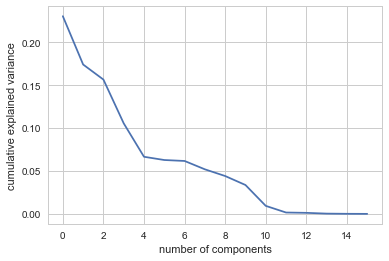

In [90]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [340]:
pca = PCA(n_components=2).fit(data_df_cleaned_scaled)
reduced_data = pca.transform(data_df_cleaned_scaled)

In [341]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(reduced_data)

In [342]:
len(kmeans.labels_)

12144

In [343]:
len(data_df_cleaned)

12144

In [344]:
data_df_cleaned['kmeans_label'] = kmeans.labels_
data_df_cleaned['stock_id'] = stock_id
data_df_cleaned['item_id'] = item_id

In [345]:

data_df_cleaned[(data_df_cleaned.max_drop == 0) & (data_df_cleaned.std_in_cluster == 0)]


,max_consecutive_na,max_drop,max_v,mean_in_cluster,median_v,min_v,n_cluster,n_consecutive_na,n_days,n_jumps,n_unique_stock_id,range_v,ratio_drop,ratio_of_na,std_in_cluster,std_v,kmeans_label,stock_id,item_id
9,3,-0.0,50.0,51.0,50.0,50.0,0,3,10,4,1,0.0,-0.0,0.500000,0.0,0.0,0,29111920001,7101373
13,1,-0.0,994.0,995.0,994.0,994.0,0,5,14,8,2,0.0,-0.0,0.357143,0.0,0.0,0,-3646252237382961517,7023163
15,4,-0.0,1.0,2.0,1.0,1.0,1,5,52,42,4,0.0,-0.0,0.173077,0.0,0.0,0,28694973001,6346792
16,2,-0.0,5.0,6.0,5.0,5.0,1,5,72,65,12,0.0,-0.0,0.083333,0.0,0.0,0,3250841,4953160
21,9,-0.0,2.0,3.0,2.0,2.0,1,4,37,23,4,0.0,-0.0,0.351351,0.0,0.0,0,14702,6510269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23674,1,-0.0,1.0,2.0,1.0,1.0,0,2,6,3,1,0.0,-0.0,0.333333,0.0,0.0,0,896179864417545821,6516820
23675,2,-0.0,1.0,2.0,1.0,1.0,1,2,17,13,2,0.0,-0.0,0.176471,0.0,0.0,0,-269677899597900233,6874664
23679,4,-0.0,1.0,2.0,1.0,1.0,1,5,51,41,4,0.0,-0.0,0.176471,0.0,0.0,0,28711592001,6375526
23692,8,-0.0,9.0,10.0,9.0,9.0,1,12,76,55,2,0.0,-0.0,0.263158,0.0,0.0,0,54190546296977879,5755580


In [347]:
qgrid.show_grid(data_df_cleaned)

QgridWidget(grid_options={'enableTextSelectionOnCells': True, 'editable': True, 'explicitInitialization': True, 'minVisibleRows': 8, 'enableColumnReorder': False, 'defaultColumnWidth': 150, 'maxVisibleRows': 15, 'fullWidthRows': True, 'rowHeight': 28, 'autoEdit': False, 'syncColumnCellResize': True, 'forceFitColumns': True}, precision=5)

In [179]:
data_df_cleaned_removed_static = data_df_cleaned[~((data_df_cleaned.max_drop == 0) & (data_df_cleaned.std_in_cluster == 0))]

In [ ]:
data_df_cleaned_removed_static

In [184]:
qgrid.show_grid(data_df_cleaned_removed_static)

QgridWidget(grid_options={'enableTextSelectionOnCells': True, 'editable': True, 'explicitInitialization': True, 'minVisibleRows': 8, 'enableColumnReorder': False, 'defaultColumnWidth': 150, 'maxVisibleRows': 15, 'fullWidthRows': True, 'rowHeight': 28, 'autoEdit': False, 'syncColumnCellResize': True, 'forceFitColumns': True}, precision=5)

In [270]:
# super clean

qgrid.show_grid(data_df_cleaned_removed_static[(data_df_cleaned_removed_static.max_consecutive_na < 10 ) & (data_df_cleaned_removed_static.std_in_cluster < 5) & (data_df_cleaned_removed_static.n_cluster != 0) & (data_df_cleaned_removed_static.std_v < 10)] )


QgridWidget(grid_options={'enableTextSelectionOnCells': True, 'editable': True, 'explicitInitialization': True, 'minVisibleRows': 8, 'enableColumnReorder': False, 'defaultColumnWidth': 150, 'maxVisibleRows': 15, 'fullWidthRows': True, 'rowHeight': 28, 'autoEdit': False, 'syncColumnCellResize': True, 'forceFitColumns': True}, precision=5)

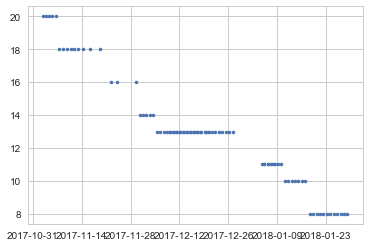

In [406]:
# best - 6436054, 5176798, 5617988


# 6046687, 6436054, 5584011, 5133531, 5687408, 5446612, 6688728,
#        5336343, 5901249, 4977684, 5877568, 5510716, 4913721, 5584752,
#        5697317, 5362006, 4853830, 5133534, 5933999, 5739346, 5838309,
#        5222669, 5560702, 4854047, 6494737, 5659527, 4820234, 5569314,

tmp_df = list(get_tables_from_goodsNum('5569314')['colt_item_ivt_df'].groupby('STOCK_ID'))[0][1]
plt.plot(tmp_df.index, tmp_df.STOCK_AMOUNT, '.')
plt.show()

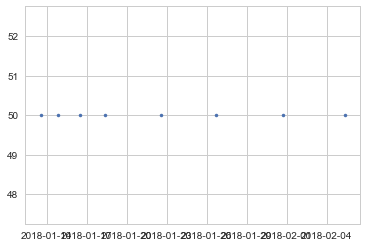

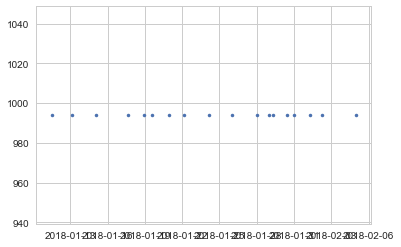

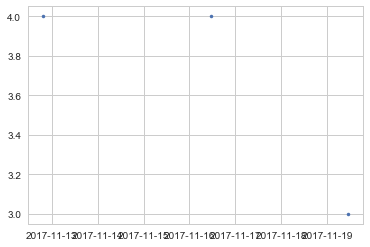

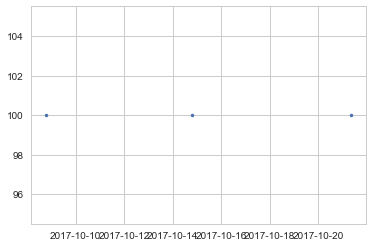

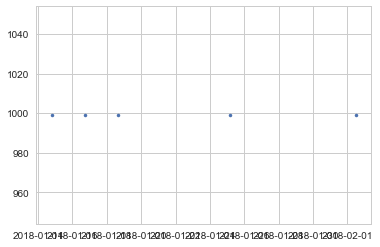

...

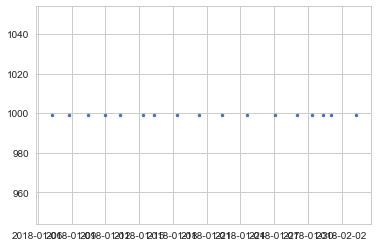

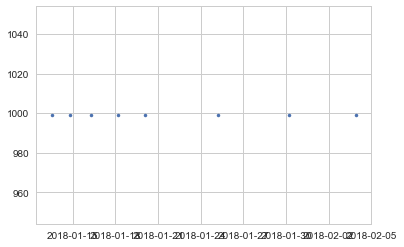

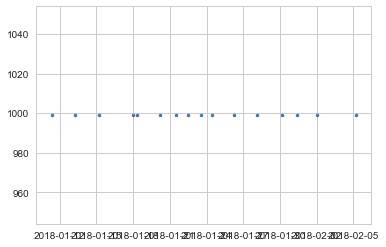

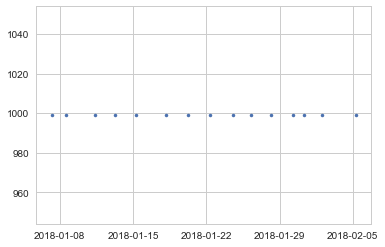

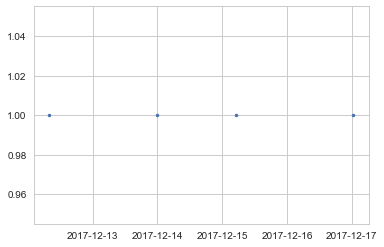

In [352]:
for item_id in data_df_cleaned.item_id[data_df_cleaned.n_cluster == 0].values:

    tmp_df = list(get_tables_from_goodsNum(item_id)['colt_item_ivt_df'].groupby('STOCK_ID'))[0][1]
    plt.plot(tmp_df.index, tmp_df.STOCK_AMOUNT, '.')
    plt.show()